In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import anderson
from sklearn.preprocessing import MultiLabelBinarizer
from ydata_profiling import ProfileReport
%matplotlib inline

In [2]:
datos = pd.read_csv('manzanas.csv')
datos.head()

,ID,Tamaño,Peso,Dulzura,Textura,Humedad,Madurez,Acidez,Calidad
0,0.0,-3.970049,-2.512336,5.346330,-1.012009,1.844900,0.329840,-0.491590483,buena
1,1.0,-1.195217,-2.839257,3.664059,1.588232,0.853286,0.867530,-0.722809367,buena
2,2.0,-0.292024,-1.351282,-1.738429,-0.342616,2.838636,-0.038033,2.621636473,mala
3,3.0,-0.657196,-2.271627,1.324874,-0.097875,3.637970,-3.413761,0.790723217,buena
4,4.0,1.364217,-1.296612,-0.384658,-0.553006,3.030874,-1.303849,0.501984036,buena


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

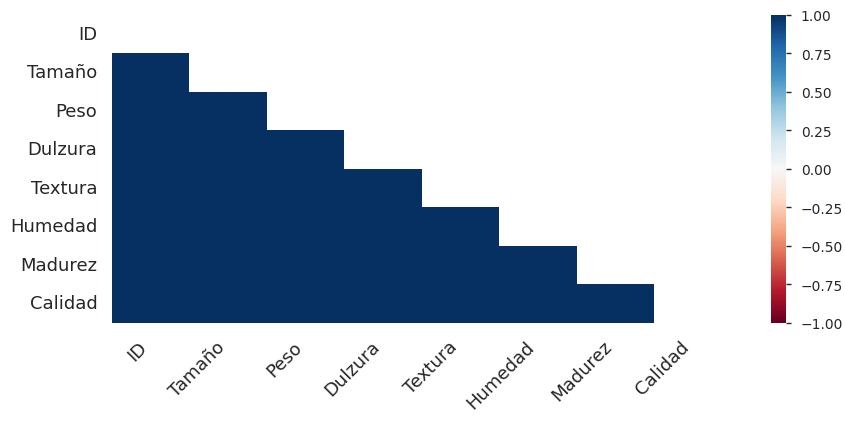

In [3]:
profile = ProfileReport(datos)
profile

In [4]:
datos.describe()

,ID,Tamaño,Peso,Dulzura,Textura,Humedad,Madurez
count,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000,4000.000000
mean,1999.500000,-0.503015,-0.989547,-0.470479,0.985478,0.512118,0.498277
std,1154.844867,1.928059,1.602507,1.943441,1.402757,1.930286,1.874427
min,0.000000,-7.151703,-7.149848,-6.894485,-6.055058,-5.961897,-5.864599
25%,999.750000,-1.816765,-2.011770,-1.738425,0.062764,-0.801286,-0.771677
50%,1999.500000,-0.513703,-0.984736,-0.504758,0.998249,0.534219,0.503445
75%,2999.250000,0.805526,0.030976,0.801922,1.894234,1.835976,1.766212
max,3999.000000,6.406367,5.790714,6.374916,7.619852,7.364403,7.237837


In [5]:
datos.dtypes

ID         float64
Tamaño     float64
Peso       float64
Dulzura    float64
Textura    float64
Humedad    float64
Madurez    float64
Acidez      object
Calidad     object
dtype: object

La columna acidez la toma como una columna de datos de tipo texto, pero revisando los datos manualmente podemos observar que dicha columna es de tipo númerica particularmente de tipo float, por esto se cambiará el tipo para poder realizar un análisis correcto.

In [6]:
datos["Acidez"] = pd.to_numeric(datos["Acidez"], errors='coerce')
datos.dtypes

ID         float64
Tamaño     float64
Peso       float64
Dulzura    float64
Textura    float64
Humedad    float64
Madurez    float64
Acidez     float64
Calidad     object
dtype: object

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

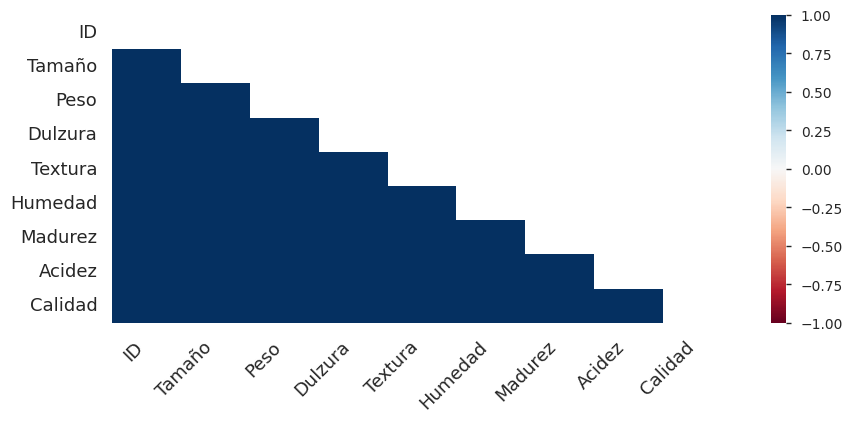

In [7]:
profile = ProfileReport(datos)
profile

In [8]:
datos.isnull().sum()

ID         1
Tamaño     1
Peso       1
Dulzura    1
Textura    1
Humedad    1
Madurez    1
Acidez     1
Calidad    1
dtype: int64

# 1.1 Análisis

En el csv se encontraron 9 columnas de las cuales 1 pertenece al id, por lo que se procederá a quitar en la limpieza de datos, también se encontró que solamente hay 1 dato por columna que posee datos nulos, y que la cantidad de datos es de cuatro mil, por lo que se procederá a quitar dicha fila, ya que no afecta al resultado. De estas 8 variables restantes (sin contar el id), 7 son numéricas y solamente 1 es categórica, la cual corresponde a la calidad que se divide en buena o mala, de las variables numéricas podemos ver que están en un rango que va desde -7.5 a 7.5, en la mayoría de estas, así mismo podemos encontrar que no hay ceros, y en estas variables numéricas encontramos que no hay datos repetidos, lo que nos asegura tener una visión bastante amplia sobre la mayor cantidad de tipos de manzanas y como sus características afectan su calidad.

# 1.2 Tipo de variables

- ID: categórica ordinal 
- Tamaño: cuantitativa continua
- Peso: cuantitativa continua
- Dulzura: cuantitativa continua
- textura: cuantitativa continua
- Humedad: cuantitativa continua
- Madurez: cuantitativa continua
- Acidez: cuantitativa continua
- Calidad: categórica nominal

# 1.3 Gráficos exploratorios

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

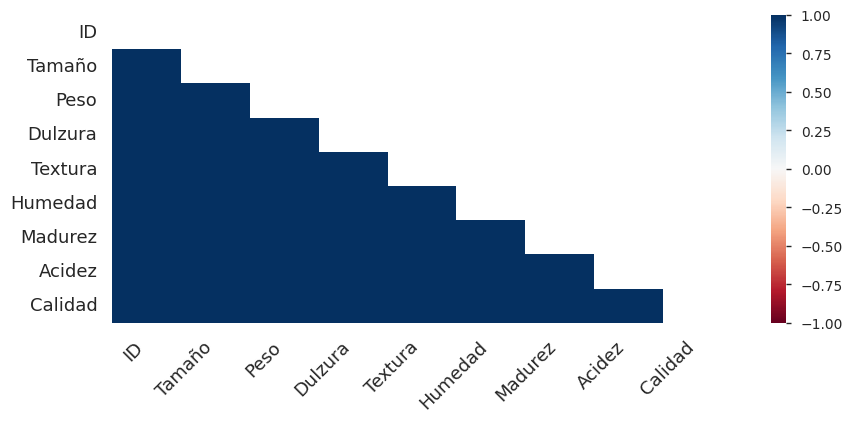

In [9]:
profile = ProfileReport(datos)
profile

# 1.4 Análisis de correlación

# 1.5 Variable categóricas

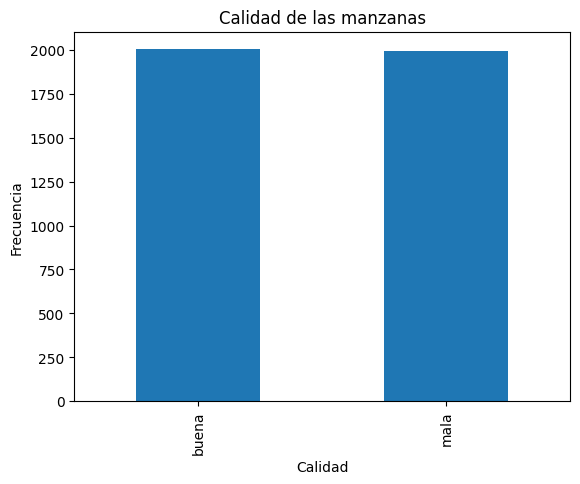

Calidad
buena    2004
mala     1996
Name: count, dtype: int64


In [10]:
datos['Calidad'].value_counts().plot(kind='bar')
plt.title('Calidad de las manzanas')
plt.xlabel('Calidad')
plt.ylabel('Frecuencia')
plt.show()
print(datos['Calidad'].value_counts())

Podemos observar que hay casi la misma cantidad de manzanas buenas como malas.

# 1.6 Limpieza de datos

Para las filas que poseen valores nulos, como se encontró anteriormente, solo hay 1 fila, por lo que se quitará sin ningún tipo de procesamiento.

In [11]:
datos = datos.dropna()
datos.isnull().sum()

ID         0
Tamaño     0
Peso       0
Dulzura    0
Textura    0
Humedad    0
Madurez    0
Acidez     0
Calidad    0
dtype: int64

El id se desechará ya que no nos proporciona información útil para nuestro propósito

In [12]:
datos = datos.drop(['ID'], axis=1)
datos.head()

,Tamaño,Peso,Dulzura,Textura,Humedad,Madurez,Acidez,Calidad
0,-3.970049,-2.512336,5.346330,-1.012009,1.844900,0.329840,-0.491590,buena
1,-1.195217,-2.839257,3.664059,1.588232,0.853286,0.867530,-0.722809,buena
2,-0.292024,-1.351282,-1.738429,-0.342616,2.838636,-0.038033,2.621636,mala
3,-0.657196,-2.271627,1.324874,-0.097875,3.637970,-3.413761,0.790723,buena
4,1.364217,-1.296612,-0.384658,-0.553006,3.030874,-1.303849,0.501984,buena


## Estandarización

Ya que solamente hay 1 variable categórica se cambiará por variable numérica utilizando 0 y 1. Donde la existencia de una significa que la otra es lo contrario. Esto es posible ya que solo hay manzanas buenas y malas.

In [13]:
X = datos.iloc[:, :-1]
y = datos.iloc[:, -1]

In [14]:
X = pd.DataFrame(X)
X.head()

,Tamaño,Peso,Dulzura,Textura,Humedad,Madurez,Acidez
0,-3.970049,-2.512336,5.346330,-1.012009,1.844900,0.329840,-0.491590
1,-1.195217,-2.839257,3.664059,1.588232,0.853286,0.867530,-0.722809
2,-0.292024,-1.351282,-1.738429,-0.342616,2.838636,-0.038033,2.621636
3,-0.657196,-2.271627,1.324874,-0.097875,3.637970,-3.413761,0.790723
4,1.364217,-1.296612,-0.384658,-0.553006,3.030874,-1.303849,0.501984


In [15]:
y = pd.DataFrame(y)
y.head()

,Calidad
0,buena
1,buena
2,mala
3,buena
4,buena


In [16]:
y = pd.get_dummies(y['Calidad'])
y.head()

,buena,mala
0,True,False
1,True,False
2,False,True
3,True,False
4,True,False


In [17]:
y = y.drop('mala', axis=1)
y.head()

,buena
0,True
1,True
2,False
3,True
4,True


In [18]:
from sklearn.preprocessing import StandardScaler
escalador = StandardScaler()
escalador.fit(X)
datosFinales = escalador.transform(X)
datosFinales = pd.DataFrame(datosFinales, columns=X.columns)
datosFinales.head()

,Tamaño,Peso,Dulzura,Textura,Humedad,Madurez,Acidez
0,-1.798424,-0.950373,2.993421,-1.424150,0.690545,-0.089872,-0.269415
1,-0.359060,-1.154404,2.127698,0.429746,0.176767,0.197020,-0.378997
2,0.109445,-0.225759,-0.652507,-0.946892,1.205422,-0.286156,1.206044
3,-0.079977,-0.800146,0.923916,-0.772399,1.619575,-2.087320,0.338315
4,0.968573,-0.191640,0.044164,-1.096894,1.305025,-0.961548,0.201472


# KNN

In [19]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(datosFinales, y["buena"], test_size=0.2, random_state=0)

Vamos a obtener el mejor valor de K para nuestro modelo.

El mejor valor de K es:  29


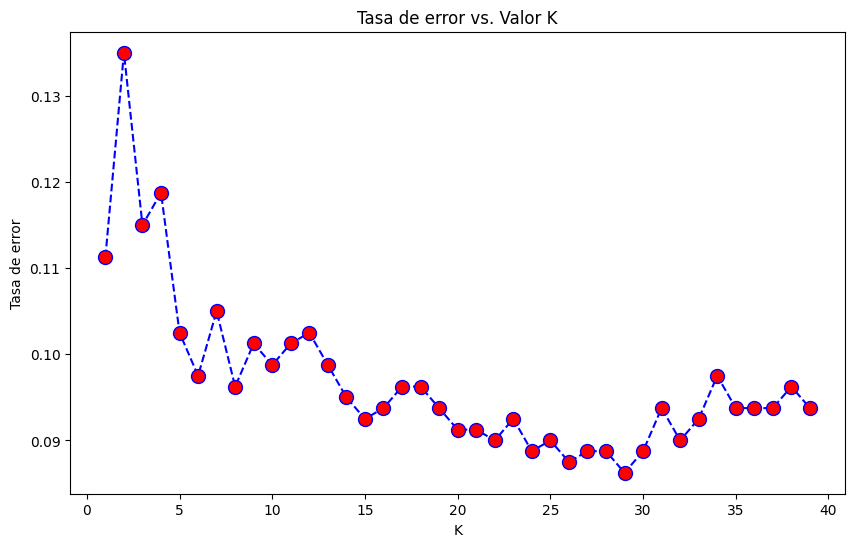

In [20]:
from sklearn.neighbors import KNeighborsClassifier
tasaError = []
for i in range(1, 40):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)
    prediccion = knn.predict(X_test)
    tasaError.append(np.mean(prediccion != y_test))

plt.figure(figsize=(10, 6))
plt.plot(range(1, 40), tasaError, color='blue', linestyle='dashed', marker='o', markerfacecolor='red', markersize=10)
plt.title('Tasa de error vs. Valor K')
plt.xlabel('K')
plt.ylabel('Tasa de error')

mejorK = tasaError.index(min(tasaError)) + 1
print('El mejor valor de K es: ', mejorK)


Con esto podemos observar que con `k=29` tenemos la menor tasa de error, es por esto que lo utilizaremos.

In [21]:
from sklearn.metrics import classification_report, confusion_matrix
knn = KNeighborsClassifier(n_neighbors=mejorK)
knn.fit(X_train, y_train)
prediccion = knn.predict(X_test)
print("Utilizando K =", mejorK)
print("Matriz de confusión: ")
print(confusion_matrix(y_test, prediccion))
print("Reporte de clasificación: ")
print(classification_report(y_test, prediccion))

Utilizando K = 29
Matriz de confusión: 
[[380  42]
 [ 27 351]]
Reporte de clasificación: 
              precision    recall  f1-score   support

       False       0.93      0.90      0.92       422
        True       0.89      0.93      0.91       378

    accuracy                           0.91       800
   macro avg       0.91      0.91      0.91       800
weighted avg       0.91      0.91      0.91       800



# SVM (Sin kernel)

In [22]:
from sklearn.svm import SVC
X_train, X_test, y_train, y_test = train_test_split(datosFinales, y["buena"], test_size=0.2, random_state=0)
# Colocaremos el kernel como lineal para que no busque el mejor kernel, suponiendo que no sabemos cuál es el mejor
svc = SVC(kernel='linear', random_state=0)
svc.fit(X_train, y_train)

SVC(kernel='linear', random_state=0)

In [23]:
matrizConfusion = confusion_matrix(y_test, svc.predict(X_test))
print("Matriz de confusión: ")
print(matrizConfusion)
print("Reporte de clasificación: ")
print(classification_report(y_test, svc.predict(X_test)))

Matriz de confusión: 
[[302 120]
 [ 81 297]]
Reporte de clasificación: 
              precision    recall  f1-score   support

       False       0.79      0.72      0.75       422
        True       0.71      0.79      0.75       378

    accuracy                           0.75       800
   macro avg       0.75      0.75      0.75       800
weighted avg       0.75      0.75      0.75       800



# SVM Kernel

Vamos a utilizar el método de busqueda por malla que nos proporciona la librería para obtener el kernel y modelo que más se ajuste, algo que no se hizo en el SVM anterior debido a que este lo va a igualar o superior así que es inecesario volver a hacerlo.

In [27]:
X_train, X_test, y_train, y_test = train_test_split(datosFinales, y["buena"], test_size=0.2, random_state=0)
svm = SVC()
from sklearn.model_selection import GridSearchCV
malla = {
    'C': [0.1, 1, 10],  # Valores de C para la regularización
    'gamma': [ 'auto', 1, 0.1, 0.01],  # Valores de gamma
    'kernel': ['rbf', 'linear', 'poly', 'sigmoid'],  # Diferentes tipos de kernel
    'degree': [2, 3],  # Grado para el kernel polinomial
    'coef0': [0.0, 0.5, 1.0]  # Término independiente para 'poly' y 'sigmoid'
}
grid_search = GridSearchCV(svm, malla, refit=True, verbose=2, cv=2)

In [28]:
# Entrenamos el modelo con la malla de hiperparámetros, esto se tardará
grid_search.fit(X_train, y_train)

Fitting 2 folds for each of 288 candidates, totalling 576 fits
[CV] END .C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END .C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=rbf; total time=   0.0s
[CV] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=linear; total time=   0.0s
[CV] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=linear; total time=   0.0s
[CV] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=poly; total time=   0.0s
[CV] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=sigmoid; total time=   0.0s
[CV] END C=0.1, coef0=0.0, degree=2, gamma=auto, kernel=sigmoid; total time=   0.0s
[CV] END ....C=0.1, coef0=0.0, degree=2, gamma=1, kernel=rbf; total time=   0.1s
[CV] END ....C=0.1, coef0=0.0, degree=2, gamma=1, kernel=rbf; total time=   0.1s
[CV] END .C=0.1, coef0=0.0, degree=2, gamma=1, kernel=linear; total time=   0.0s
[CV] END .C=0.1, coef0=0.0, degree=2

GridSearchCV(cv=2, estimator=SVC(),
             param_grid={'C': [0.1, 1, 10], 'coef0': [0.0, 0.5, 1.0],
                         'degree': [2, 3], 'gamma': ['auto', 1, 0.1, 0.01],
                         'kernel': ['rbf', 'linear', 'poly', 'sigmoid']},
             verbose=2)

In [36]:
grid_search.best_score_

0.8984375

In [30]:
grid_search.best_params_

{'C': 1, 'coef0': 0.0, 'degree': 2, 'gamma': 1, 'kernel': 'rbf'}

In [35]:
puntaje = grid_search.best_estimator_.score(X_test, y_test)
print("El puntaje del modelo es: ", puntaje)

El puntaje del modelo es:  0.90375


In [38]:
matrizConfusion = confusion_matrix(y_test, grid_search.best_estimator_.predict(X_test))
print("Matriz de confusión: ")
print(matrizConfusion)
print("Reporte de clasificación: ")
print(classification_report(y_test, grid_search.best_estimator_.predict(X_test)))

Matriz de confusión: 
[[366  56]
 [ 21 357]]
Reporte de clasificación: 
              precision    recall  f1-score   support

       False       0.95      0.87      0.90       422
        True       0.86      0.94      0.90       378

    accuracy                           0.90       800
   macro avg       0.91      0.91      0.90       800
weighted avg       0.91      0.90      0.90       800



En este caso obtuvimos que el mejor kernel es `rbf` con un valor `c = 1`, `coef0 = 0`, `degree = 2` y `gamma = 1`

# Naive Bayes

Vamos a encontrar la mejor cofiguración para el siguiente modelo.

In [42]:
from sklearn.naive_bayes import GaussianNB
X_train, X_test, y_train, y_test = train_test_split(datosFinales, y["buena"], test_size=0.2, random_state=0)
clasificador = GaussianNB()
param_grid = {'var_smoothing': np.logspace(0,-9, num=100)}
grid_search = GridSearchCV(clasificador, param_grid, cv=2, scoring='accuracy')
grid_search.fit(X_train, y_train)

GridSearchCV(cv=2, estimator=GaussianNB(),
             param_grid={'var_smoothing': array([1.00000000e+00, 8.11130831e-01, 6.57933225e-01, 5.33669923e-01,
       4.32876128e-01, 3.51119173e-01, 2.84803587e-01, 2.31012970e-01,
       1.87381742e-01, 1.51991108e-01, 1.23284674e-01, 1.00000000e-01,
       8.11130831e-02, 6.57933225e-02, 5.33669923e-02, 4.32876128e-02,
       3.51119173e-02, 2.84803587e-02, 2.31...
       1.23284674e-07, 1.00000000e-07, 8.11130831e-08, 6.57933225e-08,
       5.33669923e-08, 4.32876128e-08, 3.51119173e-08, 2.84803587e-08,
       2.31012970e-08, 1.87381742e-08, 1.51991108e-08, 1.23284674e-08,
       1.00000000e-08, 8.11130831e-09, 6.57933225e-09, 5.33669923e-09,
       4.32876128e-09, 3.51119173e-09, 2.84803587e-09, 2.31012970e-09,
       1.87381742e-09, 1.51991108e-09, 1.23284674e-09, 1.00000000e-09])},
             scoring='accuracy')

In [45]:
grid_search.best_score_

0.75

In [44]:
grid_search.best_params_

{'var_smoothing': 0.006579332246575682}

In [46]:
best = grid_search.best_estimator_
matrizConfusion = confusion_matrix(y_test, best.predict(X_test))
print("Matriz de confusión: ")
print(matrizConfusion)
print("Reporte de clasificación: ")
print(classification_report(y_test, best.predict(X_test)))

Matriz de confusión: 
[[308 114]
 [ 86 292]]
Reporte de clasificación: 
              precision    recall  f1-score   support

       False       0.78      0.73      0.75       422
        True       0.72      0.77      0.74       378

    accuracy                           0.75       800
   macro avg       0.75      0.75      0.75       800
weighted avg       0.75      0.75      0.75       800



# Enlaces
## Repositorio
- [GitHub](https://github.com/angelcast2002/hdt3.git)